In [ ]:
!pip install --upgrade tensorflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 6.7 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: h5py
    Found existing installation: h5py 3.9.0
    Uninstalling h5py-3.9.0:
      Successfully uninstalled h5py-3.9.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.2
    Uninstalling tensorboard-2.15.2:
      Successfully uninstalled tensorboard-2.15.2
  Attempting uninstall: keras
    Found e

In [ ]:
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.1/542.1 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 15.3 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow 2.16.1 which is incompatible.


In [ ]:
import tensorflow as tf
print(tf.__version__)

2.16.1


In [ ]:
import os
import tensorflow as tf
from tensorflow import keras

In [ ]:
print(keras.__version__)

3.3.3


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.xception import Xception
import pickle
from google.colab import files
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer

In [ ]:
from keras.models import load_model

# Load the Keras model
model = load_model('/content/drive/MyDrive/Colab Notebooks/dsci471/models3/model_8k_9.keras')

In [ ]:
from datasets import load_dataset

# Load the dataset
dataset = load_dataset("jxie/flickr8k", streaming=True)
train_dataset = dataset["train"]
test_dataset = dataset["test"]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
# Load pre-trained models
model = load_model('/content/drive/MyDrive/Colab Notebooks/dsci471/models3/model_8k_9.keras')
with open("/content/drive/My Drive/Colab Notebooks/dsci471/tokenizer3.pkl", "rb") as handle:
    tokenizer = pickle.load(handle)
xception_model = Xception(include_top=False, pooling="avg")

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


# Code to test first 20 images in train dataset

In [ ]:
# Get the first __ images
dataset_iter = iter(train_dataset)
images = [next(dataset_iter)['image'] for _ in range(20)]
print("First __ images:", images)

First __ images: [<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x399 at 0x7ED538EB4220>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=300x500 at 0x7ED538EB7A60>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7ED538EB7DF0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x360 at 0x7ED538E63FD0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7ED538E62B30>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x369 at 0x7ED538E62BC0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=375x500 at 0x7ED538E626B0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=333x500 at 0x7ED538E62320>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=334x500 at 0x7ED538E61F60>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x334 at 0x7ED538E61C00>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x7ED538E62050>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 940ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 400ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 334ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 566ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 954ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 335ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 351ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step


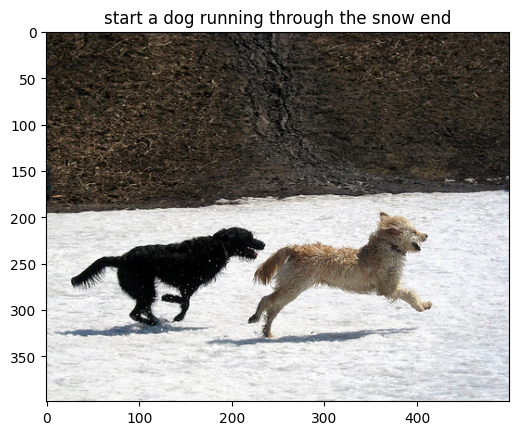

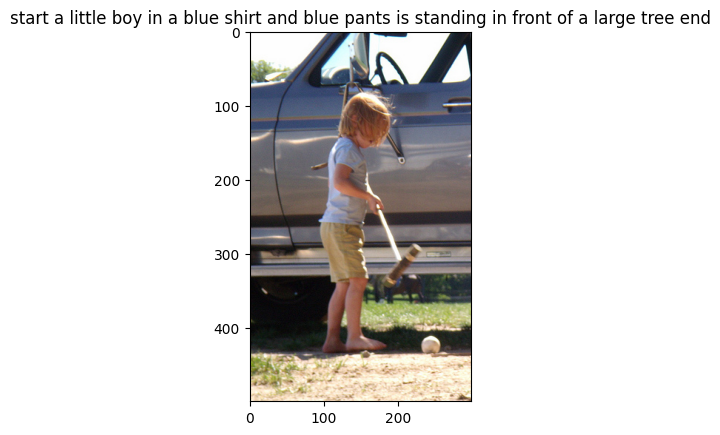

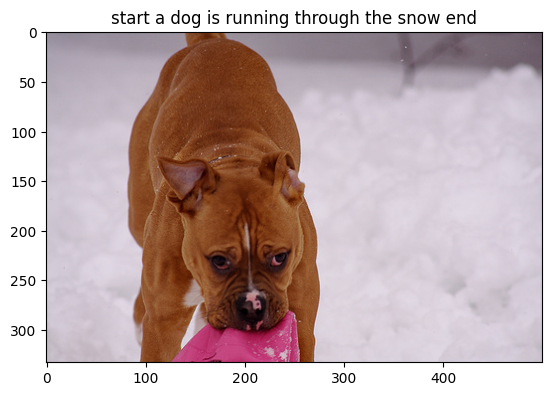

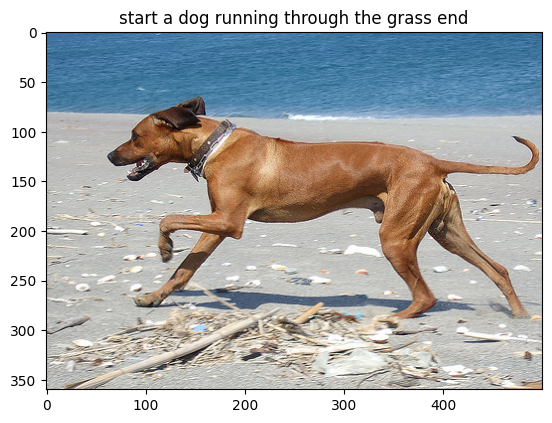

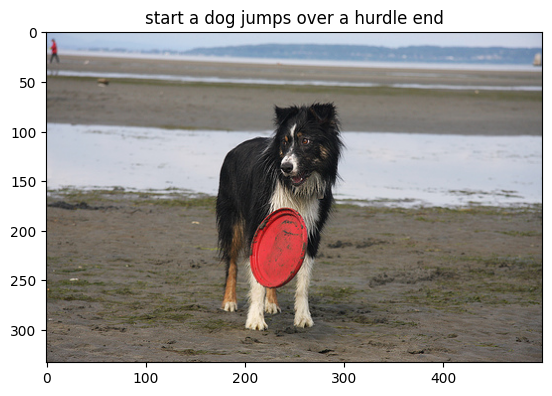

...

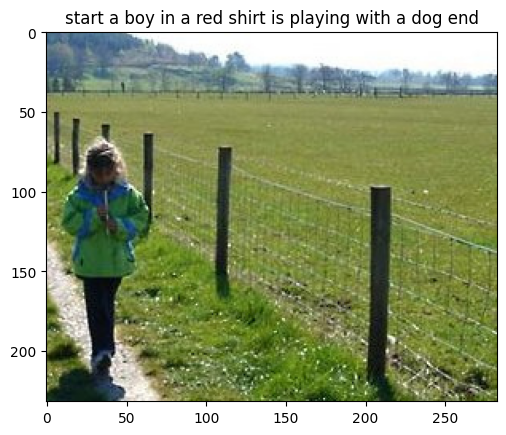

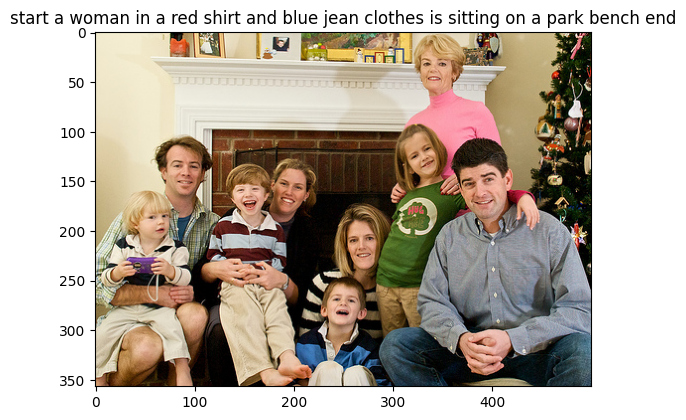

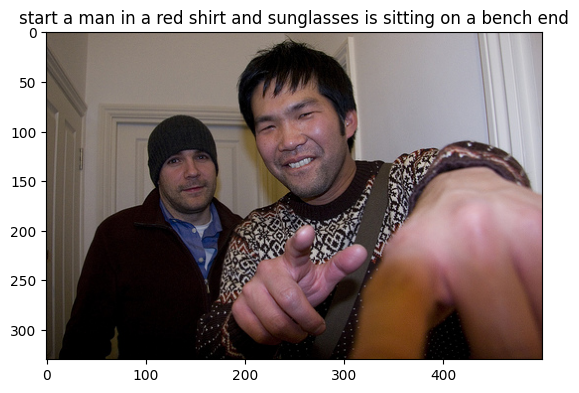

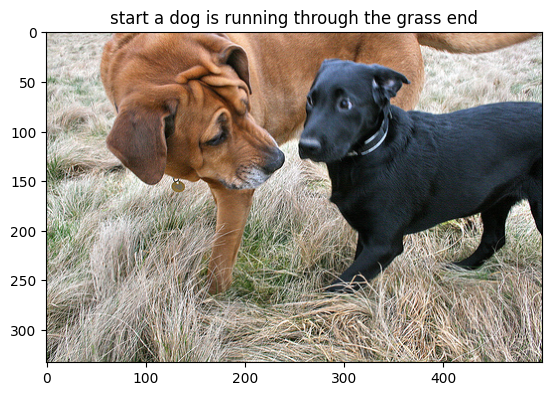

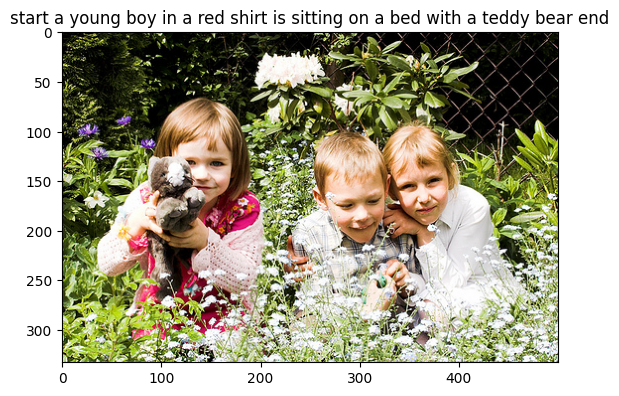

In [ ]:
# Define feature extraction function
def extract_features(image, model):
    image = image.resize((299,299))
    image = np.array(image)
    if image.shape[2] == 4:
        image = image[..., :3]
    image = np.expand_dims(image, axis=0)
    image = image / 127.5 - 1.0
    feature = model.predict(image)
    return feature

# Define function to map word index to word
def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

# Define function to generate description
def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo, sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        if word is None:
            break
        in_text += ' ' + word
        if word == 'end':
            break
    return in_text

# Generate descriptions
max_length = 38
descriptions = []
for img in images:
    photo = extract_features(img, xception_model)
    description = generate_desc(model, tokenizer, photo, max_length)
    descriptions.append(description)

# Display images with their descriptions
for img, desc in zip(images, descriptions):
    plt.imshow(img)
    plt.title(desc)
    plt.show()

# Code to test first 20 images in test dataset

In [ ]:
# Get the first __ images
dataset_iter = iter(test_dataset)
images = [next(dataset_iter)['image'] for _ in range(20)]
print("First __ images:", images)

First __ images: [<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x335 at 0x7ED538ED6CB0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x375 at 0x7ED538ED47F0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=393x500 at 0x7ED538ED6C80>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x281 at 0x7ED538ED6770>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=333x500 at 0x7ED538ED5A50>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7ED538ED5CF0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x334 at 0x7ED538ED5F30>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7ED538ED5F00>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x357 at 0x7ED538ED40D0>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x373 at 0x7ED538ED5C60>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7ED538ED5C30>, <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=500x333 at 0x7

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 346ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 330ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 332ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 339ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step


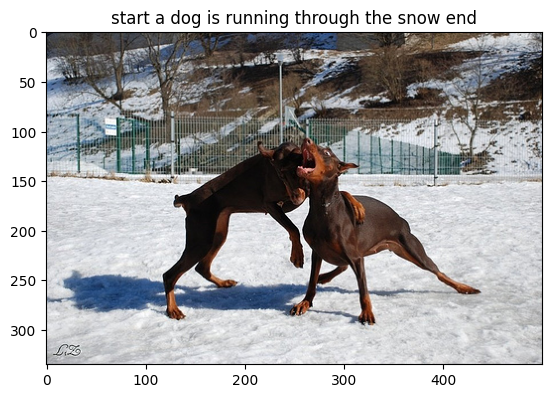

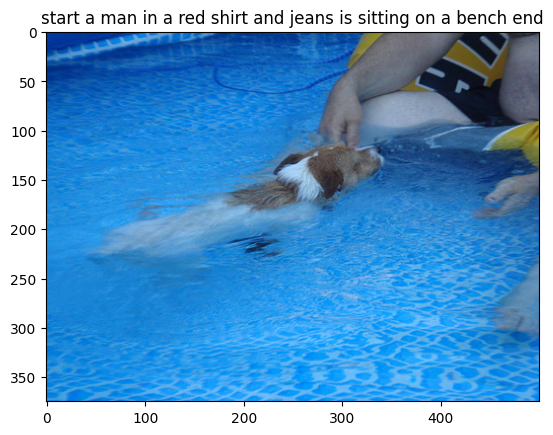

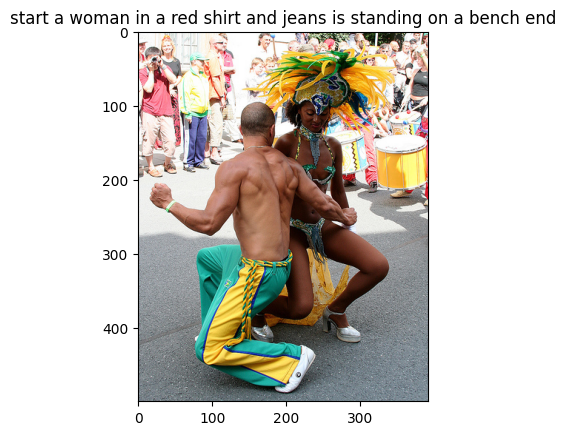

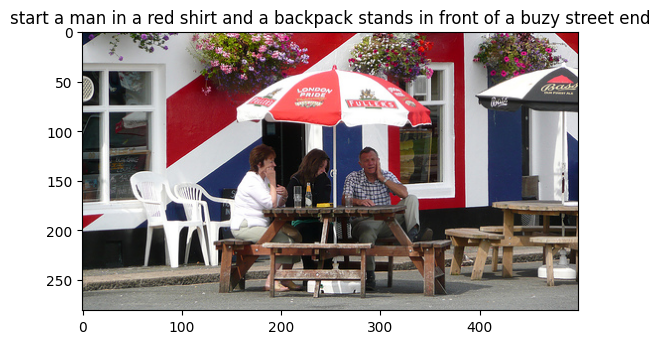

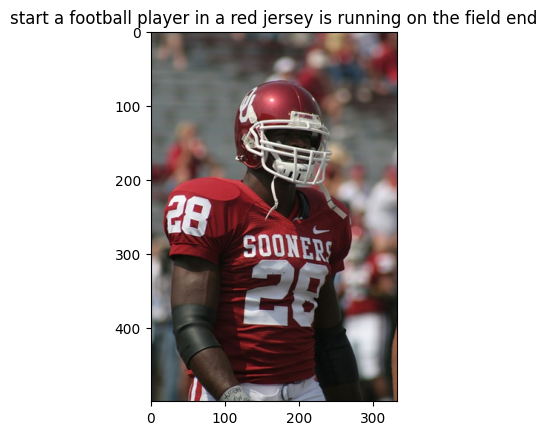

...

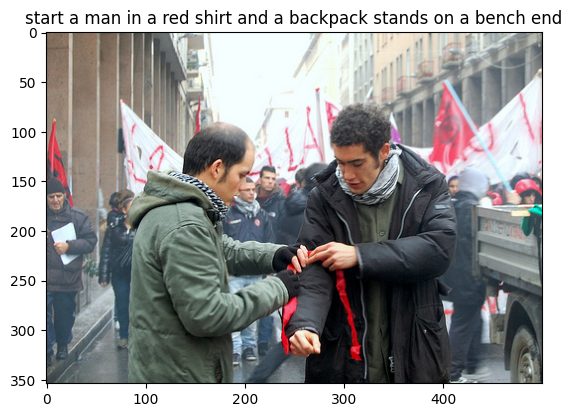

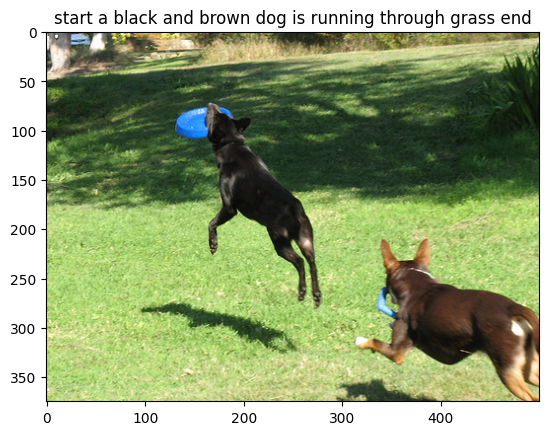

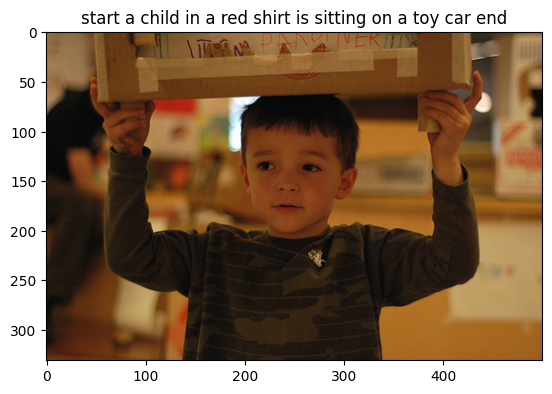

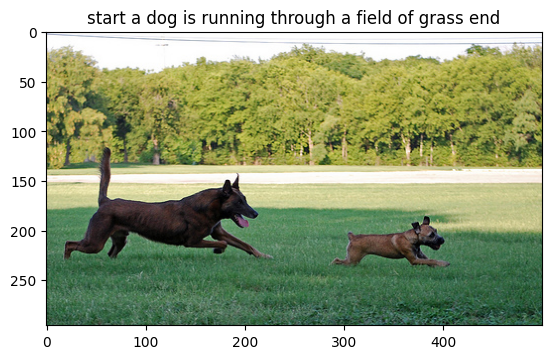

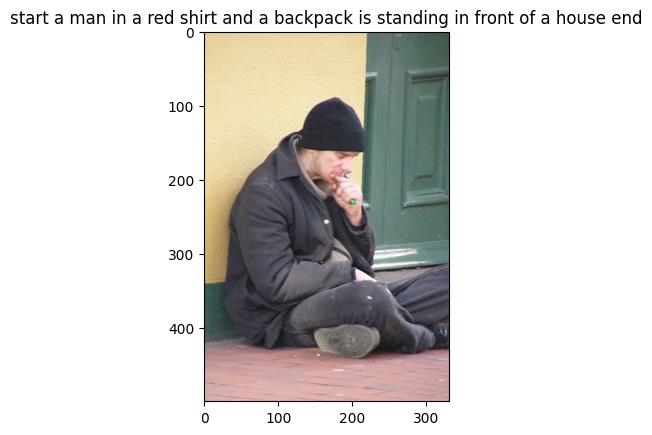

In [ ]:
# Define feature extraction function
def extract_features(image, model):
    image = image.resize((299,299))
    image = np.array(image)
    if image.shape[2] == 4:
        image = image[..., :3]
    image = np.expand_dims(image, axis=0)
    image = image / 127.5 - 1.0
    feature = model.predict(image)
    return feature

# Define function to map word index to word
def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

# Define function to generate description
def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo, sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        if word is None:
            break
        in_text += ' ' + word
        if word == 'end':
            break
    return in_text

# Generate descriptions
max_length = 38
descriptions = []
for img in images:
    photo = extract_features(img, xception_model)
    description = generate_desc(model, tokenizer, photo, max_length)
    descriptions.append(description)

# Display images with their descriptions
for img, desc in zip(images, descriptions):
    plt.imshow(img)
    plt.title(desc)
    plt.show()

# Code below is to test individual images by uploading individual files

In [ ]:
type(model)

keras.src.models.functional.Functional

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 38)             │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ input_layer (InputLayer)  │ (None, 2048)           │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ embedding (Embedding)     │ (None, 38, 256)        │      1,762,048 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 2048)           │              0 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 38, 256)        │              0 │ embedding[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ not_equal (NotEqual)      │ (None, 38)             │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 256)            │        524,544 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 256)            │        525,312 │ dropout_1[0][0],       │
│                           │                        │                │ not_equal[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 256)            │              0 │ dense[0][0],           │
│                           │                        │                │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 256)            │         65,792 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_2 (Dense)           │ (None, 6883)           │      1,768,931 │ dense_1[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 13,939,883 (53.18 MB)

 Trainable params: 4,646,627 (17.73 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 9,293,256 (35.45 MB)

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.xception import Xception
import pickle
from google.colab import files
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.text import Tokenizer

# Upload the image
uploaded = files.upload()

# Set the image path
img_path = next(iter(uploaded))  # This will get the name of the uploaded image

Saving Screen Shot 2024-06-05 at 11.49.15 PM.png to Screen Shot 2024-06-05 at 11.49.15 PM.png


In [ ]:
def extract_features(filename, model):
    try:
        image = Image.open(filename)
    except:
        print("ERROR: Couldn't open image! Make sure the image path and extension is correct")
    image = image.resize((299,299))
    image = np.array(image)
    # for images that has 4 channels, we convert them into 3 channels
    if image.shape[2] == 4:
        image = image[..., :3]
    image = np.expand_dims(image, axis=0)
    image = image/127.5
    image = image - 1.0
    feature = model.predict(image)
    return feature

def word_for_id(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
     if index == integer:
         return word
    return None

def generate_desc(model, tokenizer, photo, max_length):
    in_text = 'start'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        pred = model.predict([photo,sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        if word is None:
            break
        in_text += ' ' + word
        if word == 'end':
            break
    return in_text

max_length = 38

# Load the tokenizer
with open("/content/drive/My Drive/Colab Notebooks/dsci471/tokenizer3.pkl", "rb") as handle:
    tokenizer = pickle.load(handle)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step



start a soccer game in progress end


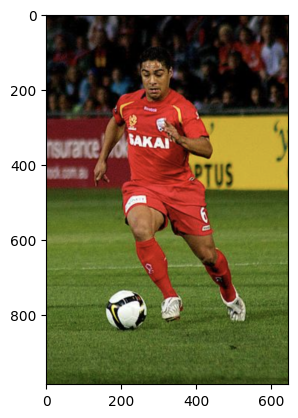

In [ ]:
# Load the Xception model
xception_model = Xception(include_top=False, pooling="avg")

# Extract features from the image
photo = extract_features(img_path, xception_model)
img = Image.open(img_path)
description = generate_desc(model, tokenizer, photo, max_length)
print("\n\n")
print(description)
plt.imshow(img)